In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


# Step 1. 데이터셋 내려받기

https://www.tensorflow.org/datasets/catalog/tf_flowers

In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

In [4]:
# !mkdir -p ~/aiffel/Deep_Learning/24_Main_Project/flowers

In [5]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/Deep_Learning/24_Main_Project/flowers/',
    download=True,
    with_info=True,
    as_supervised=True,
)

In [6]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


# Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기

In [7]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

tf.data.Dataset에서 제공하는 take 함수 : 인수로 받은 만큼의 개수만큼의 데이터를 추출하여 새로운 데이터셋 인스턴스를 생성하여 리턴

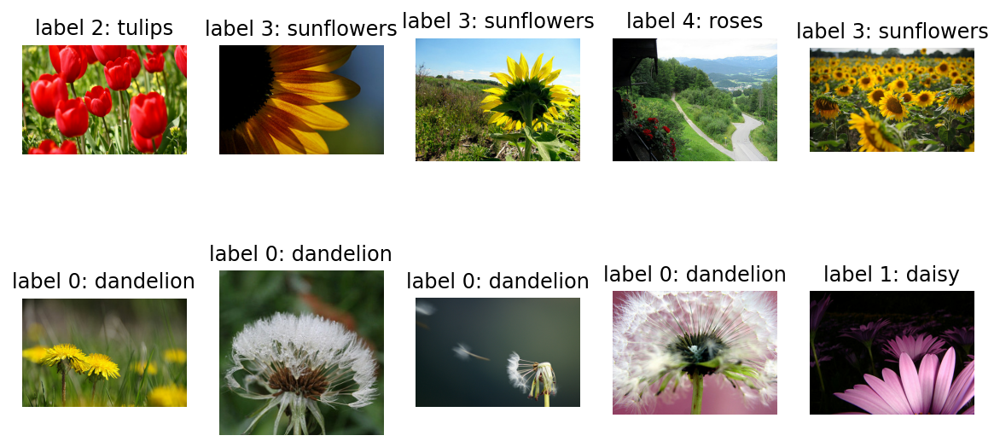

In [8]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

format_example() 함수를 이용해 이미지를 같은 포맷으로 통일

In [9]:
IMG_SIZE = 240 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

format_example() 함수를 raw_train, raw_validation, raw_test 에 map() 함수로 적용시켜서 변환

In [10]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((240, 240, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((240, 240, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((240, 240, 3), ()), types: (tf.float32, tf.int64)>


## ㄴ pre 문제해결 회고
1. 이미지 크기를 (240, 240, 3)로 변경했을 때 validation accuracy가 83% 벽을 넘었다.

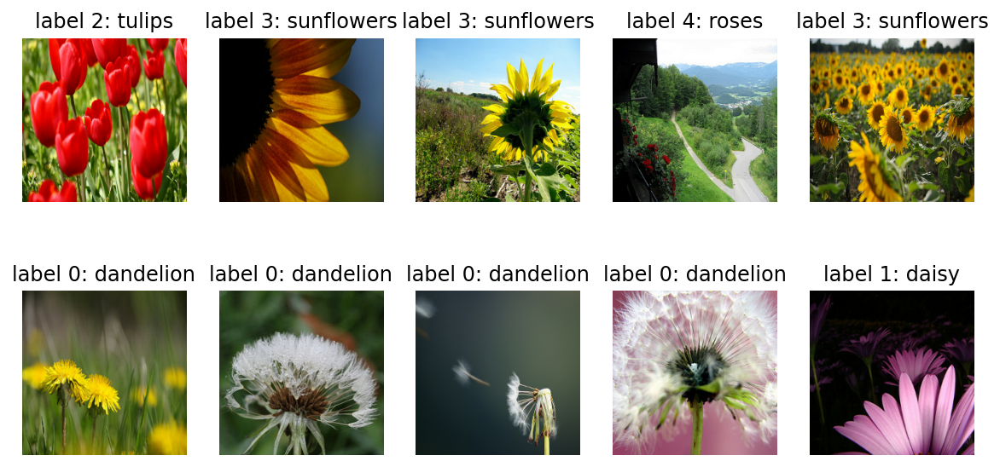

In [11]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

raw_train을 train으로 바꾸었다.
matplotlib으로 이미지를 시각화 할 경우에는 모든 픽셀값이 양수여야 하므로, -1 ~ 1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0 ~ 1 사이의 값으로 변환

tf_flowers 데이터셋 레이블 비율 시각화

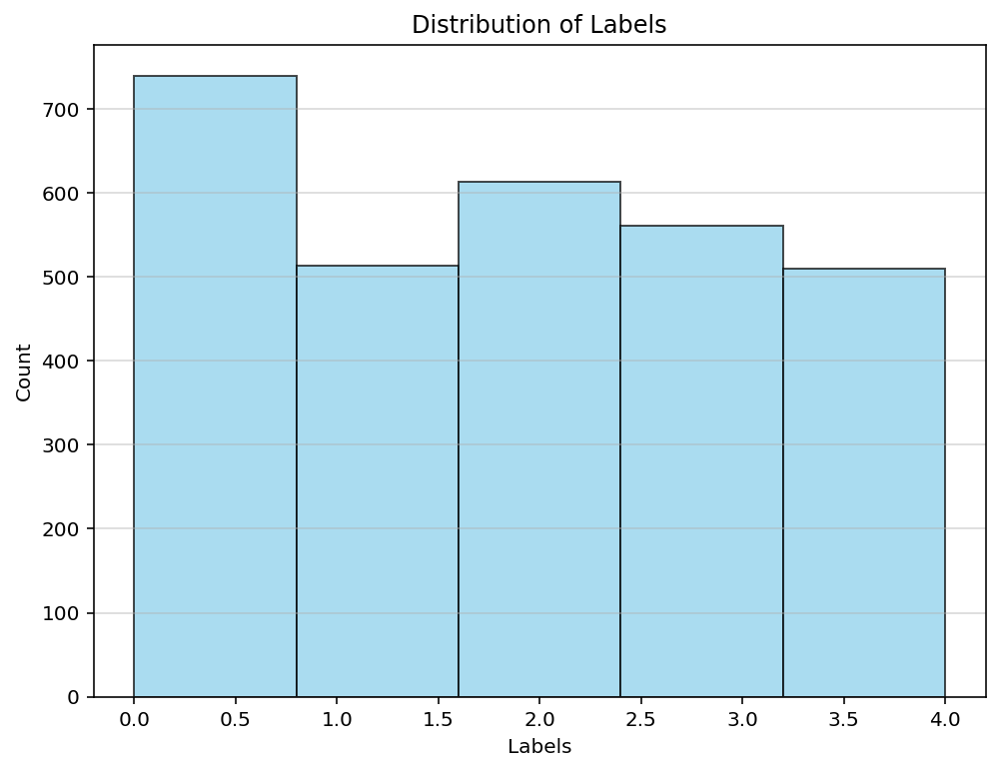

In [12]:
labels = []
for _, label in train:
    labels.append(label.numpy())

plt.figure(figsize=(8, 6))
plt.hist(labels, bins=len(set(labels)), color='skyblue', edgecolor='black', alpha=0.7)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.title('Distribution of Labels')
plt.grid(axis='y', alpha=0.5)
plt.show()

한 스텝에 학습시킬 데이터의 개수인 BATCH_SIZE와 학습 데이터를 적절히 섞어줄 SHUFFLE_BUFFER_SIZE를 설정

In [13]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 200

In [14]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [15]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 240, 240, 3]), TensorShape([32]))

# Step 3-1. 베이스라인 모델 설계하기

In [16]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

### 베이스라인 모델

In [21]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(240, 240, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

tf_flowers 데이터셋에서는 class의 갯수가 5가지이므로, softmax layer의 output units을 5로 설정

In [22]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 240, 240, 16)      448       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 120, 120, 16)      0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 120, 120, 32)      4640      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 60, 60, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 60, 60, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 30, 30, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 57600)            

### 베이스라인 모델 compile 완료 후 학습시키기

In [23]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

- learning rate : 빠른 학습을 위해 0.001
- optimizer : 빠른 학습을 위하여 Adam
- loss function : 0 ~ 4 정수 레이블 다중 클래스 분류이므로 sparse_categorical_crossentropy
- metrics : 5개 클래스 분류이므로 accuracy

초기 모델의 성능 확인

In [24]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 1.6309 - accuracy: 0.1580WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 3s 25ms/step - loss: 1.6309 - accuracy: 0.1580
initial loss: 1.63
initial accuracy: 0.16


학습

In [25]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 6s 57ms/step - loss: 1.5317 - accuracy: 0.4458 - val_loss: 1.0987 - val_accuracy: 0.5831
Epoch 2/10
92/92 [==============================] - 5s 53ms/step - loss: 0.9691 - accuracy: 0.6311 - val_loss: 1.0215 - val_accuracy: 0.6431
Epoch 3/10
92/92 [==============================] - 5s 53ms/step - loss: 0.6810 - accuracy: 0.7500 - val_loss: 1.0373 - val_accuracy: 0.6431
Epoch 4/10
92/92 [==============================] - 5s 54ms/step - loss: 0.3821 - accuracy: 0.8672 - val_loss: 1.1812 - val_accuracy: 0.6322
Epoch 5/10
92/92 [==============================] - 5s 53ms/step - loss: 0.1542 - accuracy: 0.9550 - val_loss: 1.5697 - val_accuracy: 0.5967
Epoch 6/10
92/92 [==============================] - 5s 54ms/step - loss: 0.0883 - accuracy: 0.9745 - val_loss: 1.8690 - val_accuracy: 0.6185
Epoch 7/10
92/92 [==============================] - 5s 53ms/step - loss: 0.1102 - accuracy: 0.9646 - val_loss: 1.7909 - val_accuracy: 0.6403
Epoch 8/10
92

### 베이스라인 모델 학습곡선 확인 및 예측 결과 시각화

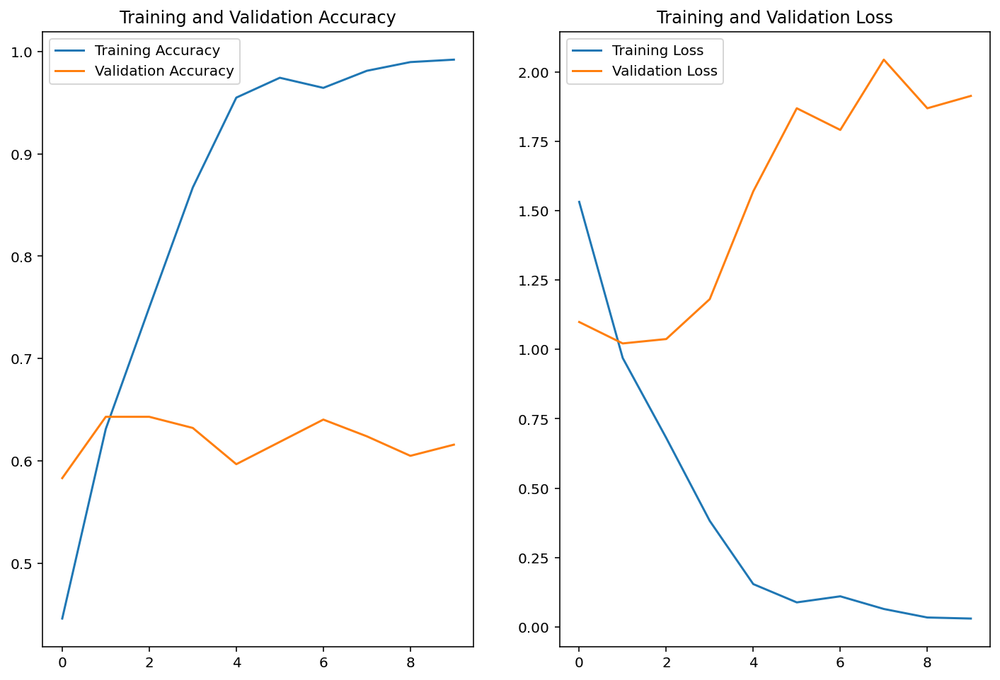

In [26]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

### 결과 해석
: 2번째 에폭 이후 뚜렷한 오버피팅 발생하였다.

### 예측 결과 확인 및 시각화

In [27]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[2.30050894e-08, 4.27666600e-05, 5.53312991e-03, 1.89884705e-03,
        9.92525220e-01],
       [9.99964714e-01, 2.70466826e-05, 3.11004328e-06, 1.83591180e-11,
        5.07782215e-06],
       [8.14938128e-01, 2.73111579e-03, 4.54351492e-02, 1.34234745e-02,
        1.23472147e-01],
       [6.74316718e-04, 8.66537154e-01, 7.31054470e-02, 4.28541682e-07,
        5.96827455e-02],
       [5.29891551e-01, 3.58758986e-01, 8.97746533e-04, 2.72941459e-02,
        8.31576064e-02],
       [4.15542275e-02, 6.05348051e-01, 6.07011504e-02, 1.69538870e-03,
        2.90701181e-01],
       [9.60845045e-06, 7.61318952e-03, 9.88707304e-01, 7.21326569e-06,
        3.66275525e-03],
       [2.91189760e-01, 6.10822393e-03, 3.80608946e-01, 2.62838253e-03,
        3.19464713e-01],
       [1.19227821e-06, 3.23791260e-09, 4.82306106e-08, 9.99995232e-01,
        3.54120493e-06],
       [9.99978304e-01, 2.94335251e-07, 3.96646520e-08, 1.14938857e-11,
        2.14366410e-05],
       [9.96815860e-01, 3.1344

5개 클래스에 대한 확률 분포가 잘 나타남

In [28]:
# 예측 확률을 예측 레이블로 변환
import numpy as np

predictions = np.argmax(predictions, axis=1)
predictions

array([4, 0, 0, 1, 0, 1, 2, 2, 3, 0, 0, 0, 4, 4, 0, 3, 2, 0, 0, 4, 2, 0,
       2, 0, 4, 0, 2, 1, 2, 4, 0, 2])

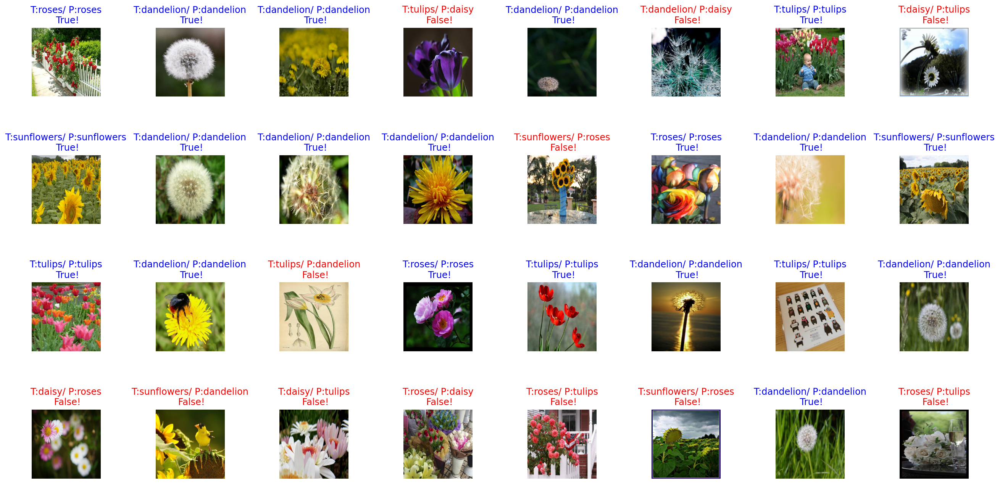

In [62]:
plt.figure(figsize=(22, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    
    # 실제 레이블 / 예측 레이블을 비교할 수 있도록 코드를 작성함
    plt.subplots_adjust(wspace=0.8, hspace=0.1) # 좌우 여백 확보
    title = f'T:{get_label_name(label)}/ P:{get_label_name(prediction)}\n {correct}!' # metadata.feauture에서 label 가져오기
    
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

#### ㄴ 실제 레이블 / 예측 레이블을 비교할 수 있도록 코드를 작성함

In [46]:
# 배치 1 정확도
count = 0  
for image, label, prediction in zip(images, labels, predictions):
    if label == prediction:
        count += 1

print(count / 32 * 100)

62.5


# 3-2. Pre-trained model InceptionV3을 활용한 Transfer Learning 모델링

### Transfer Learning 전략
1. 주어진 tf_flowers 데이터셋은 크기가 3,670로 작은 편이다.
2. Imagenet은 꽃 클래스에 다양한 종류의 꽃 이미지를 포함하고 있으므로 데이터 유사성은 높다고 가정한다. 
3. 따라서 오버피팅을 피하고, 주어진 태스크에 맞게 pre-trained InceptinoV3의 classifier 부분만 재학습시키는 전략으로 transfer learning을 진행한다.

In [47]:
# InceptionV3 모델 생성
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Convolution base만 가져온다.
base_model = tf.keras.applications.InceptionV3(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [48]:
image_batch.shape

TensorShape([32, 240, 240, 3])

In [49]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 6, 6, 2048])

InceptionV3의 convolution base layer를 통과하면 3,3,2048 크기의 feature map을 가진다.

In [50]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 240, 240, 3) 0                                            
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 119, 119, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 119, 119, 32) 96          conv2d_6[0][0]                   
__________________________________________________________________________________________________
activation (Activation)         (None, 119, 119, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

### Classifier layer 생성

Flatten layer를 사용하지 않고 global average pooling을 적용한다. 컴퓨팅 비용을 고려하여 파라미터 수를 최소화한다.

https://gaussian37.github.io/dl-concept-global_average_pooling/

In [51]:
# Flatten이 아닌 GlobalAveragePooling2D 사용 - output size - (Batch size, 2048)
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)

# classifion dense layer
dense_layer_1 = tf.keras.layers.Dense(units=256, activation='relu')

# 5개 클래스 분류이므로 softmax, units=5
prediction_layer = tf.keras.layers.Dense(units=5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer_1(feature_batch_average))
print(prediction_batch.shape)

(32, 5)


In [52]:
# Pre-trained model의 convolution base 부분의 가중치는 업데이트하지 않는다.
base_model.trainable = False

### 최종 Transfer learing model

In [53]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer_1,
  prediction_layer
])

In [54]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Functional)    (None, 6, 6, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 256)               524544    
_________________________________________________________________
dense_5 (Dense)              (None, 5)                 1285      
Total params: 22,328,613
Trainable params: 525,829
Non-trainable params: 21,802,784
_________________________________________________________________


### InceptionV3 기반으로 구성된 이미지 분류기를 학습시키고, 베이스라인 모델과 결과 비교

In [55]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

학습 전 성능 확인

In [56]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 1s - loss: 1.9145 - accuracy: 0.0981WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 4s 91ms/step - loss: 1.9145 - accuracy: 0.0981
initial loss: 1.91
initial accuracy: 0.10


모델 학습

In [57]:
from tensorflow.keras import callbacks
check_point_cb = callbacks.ModelCheckpoint('InceptionV3_flowers.h5', save_best_only=True)
early_stopping_cb = callbacks.EarlyStopping(patience=3, monitor='val_accuracy',
                                  restore_best_weights=True)

EPOCHS = 15  
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[check_point_cb, early_stopping_cb])

Epoch 1/15
92/92 [==============================] - 14s 112ms/step - loss: 0.7776 - accuracy: 0.7190 - val_loss: 0.4761 - val_accuracy: 0.8474
Epoch 2/15
92/92 [==============================] - 9s 100ms/step - loss: 0.4120 - accuracy: 0.8569 - val_loss: 0.3877 - val_accuracy: 0.8801
Epoch 3/15
92/92 [==============================] - 9s 100ms/step - loss: 0.3180 - accuracy: 0.8954 - val_loss: 0.3450 - val_accuracy: 0.8937
Epoch 4/15
92/92 [==============================] - 10s 103ms/step - loss: 0.2682 - accuracy: 0.9121 - val_loss: 0.3210 - val_accuracy: 0.8883
Epoch 5/15
92/92 [==============================] - 9s 101ms/step - loss: 0.2297 - accuracy: 0.9281 - val_loss: 0.3193 - val_accuracy: 0.9019
Epoch 6/15
92/92 [==============================] - 10s 103ms/step - loss: 0.1962 - accuracy: 0.9424 - val_loss: 0.2995 - val_accuracy: 0.9074
Epoch 7/15
92/92 [==============================] - 10s 102ms/step - loss: 0.1726 - accuracy: 0.9499 - val_loss: 0.3029 - val_accuracy: 0.9074
Ep

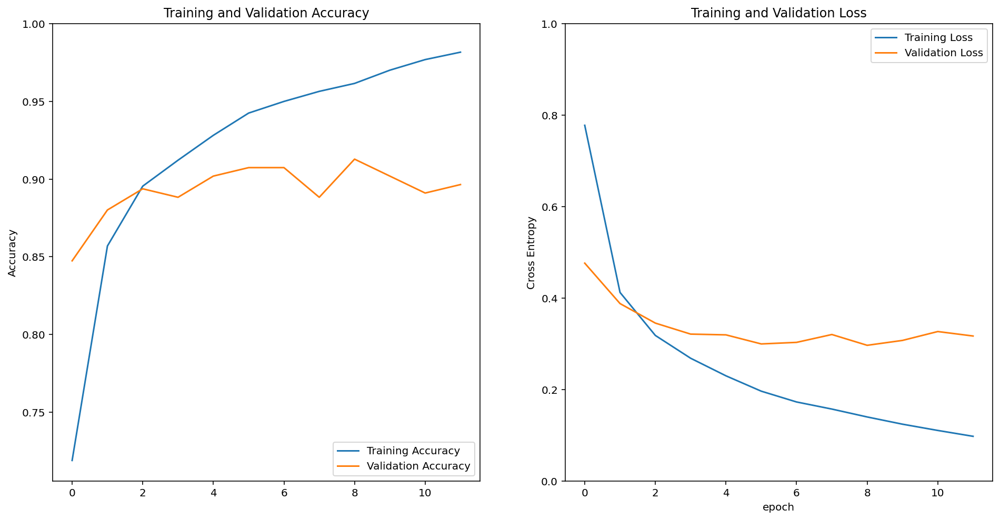

In [63]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### 결과 시각화

In [64]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[5.1246170e-04, 8.7350970e-03, 3.5562587e-01, 1.7798319e-02,
        6.1732829e-01],
       [9.9998677e-01, 1.0432648e-05, 1.3101262e-06, 8.1107748e-07,
        5.9615763e-07],
       [5.8129776e-01, 4.7775246e-03, 9.4389571e-03, 4.0304574e-01,
        1.4399686e-03],
       [4.3662067e-06, 1.8371814e-03, 3.1058505e-01, 1.8862751e-04,
        6.8738478e-01],
       [9.9994707e-01, 4.1377669e-05, 2.7977744e-06, 8.0016152e-06,
        7.3771201e-07],
       [9.9985778e-01, 2.2045191e-05, 6.6539738e-05, 2.5567895e-05,
        2.7993538e-05],
       [5.1389118e-03, 9.0601802e-02, 8.2490540e-01, 7.4859627e-02,
        4.4942321e-03],
       [1.8642507e-02, 9.0143472e-01, 1.9255074e-05, 7.9726093e-02,
        1.7740391e-04],
       [2.7785072e-02, 1.7086970e-02, 2.2508677e-03, 9.5211488e-01,
        7.6224300e-04],
       [9.9996519e-01, 3.2060507e-05, 1.2316153e-06, 1.0255321e-06,
        4.2396658e-07],
       [9.8155713e-01, 1.6671177e-02, 9.9351234e-04, 5.6244561e-04,
        2.15

In [65]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 0, 0, 4, 0, 0, 2, 1, 3, 0, 0, 0, 3, 2, 0, 3, 2, 0, 2, 4, 2, 0,
       0, 0, 1, 3, 1, 2, 4, 3, 0, 4])

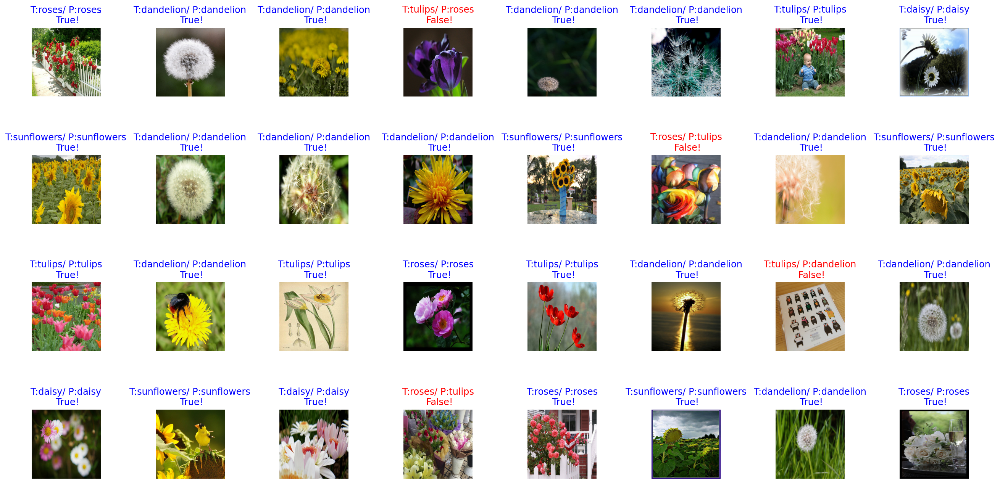

In [66]:
plt.figure(figsize=(22, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    
    # 실제 레이블 / 예측 레이블을 비교할 수 있도록 코드를 작성함
    plt.subplots_adjust(wspace=0.8, hspace=0.1) # 좌우 여백 확보
    title = f'T:{get_label_name(label)}/ P:{get_label_name(prediction)}\n {correct}!' # metadata.feauture에서 label 가져오기
    
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [67]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) 

87.5


### 전체 test set evalution

In [68]:
model.evaluate(test_batches)

12/12 [==============================] - 1s 75ms/step - loss: 0.2589 - accuracy: 0.9019


[0.25888726115226746, 0.9019073843955994]

In [70]:
from sklearn.metrics import classification_report
# 1. 예측 확률값
pred = model.predict(test_batches)

# 2. 실제 레이블
labels = []
for _, label in test:
    labels.append(label.numpy())
np.array(labels)

# 3. 클래스 이름 지정
class_names = metadata.features['label'].names

# 4. 분류 보고서 확인
print(classification_report(labels, np.argmax(pred, axis=-1), target_names=class_names))

              precision    recall  f1-score   support

   dandelion       0.89      0.96      0.92        70
       daisy       0.95      0.92      0.93        61
      tulips       0.86      0.91      0.88        85
  sunflowers       0.94      0.87      0.90        76
       roses       0.89      0.87      0.88        75

    accuracy                           0.90       367
   macro avg       0.91      0.90      0.90       367
weighted avg       0.90      0.90      0.90       367



### 히트맵 시각화

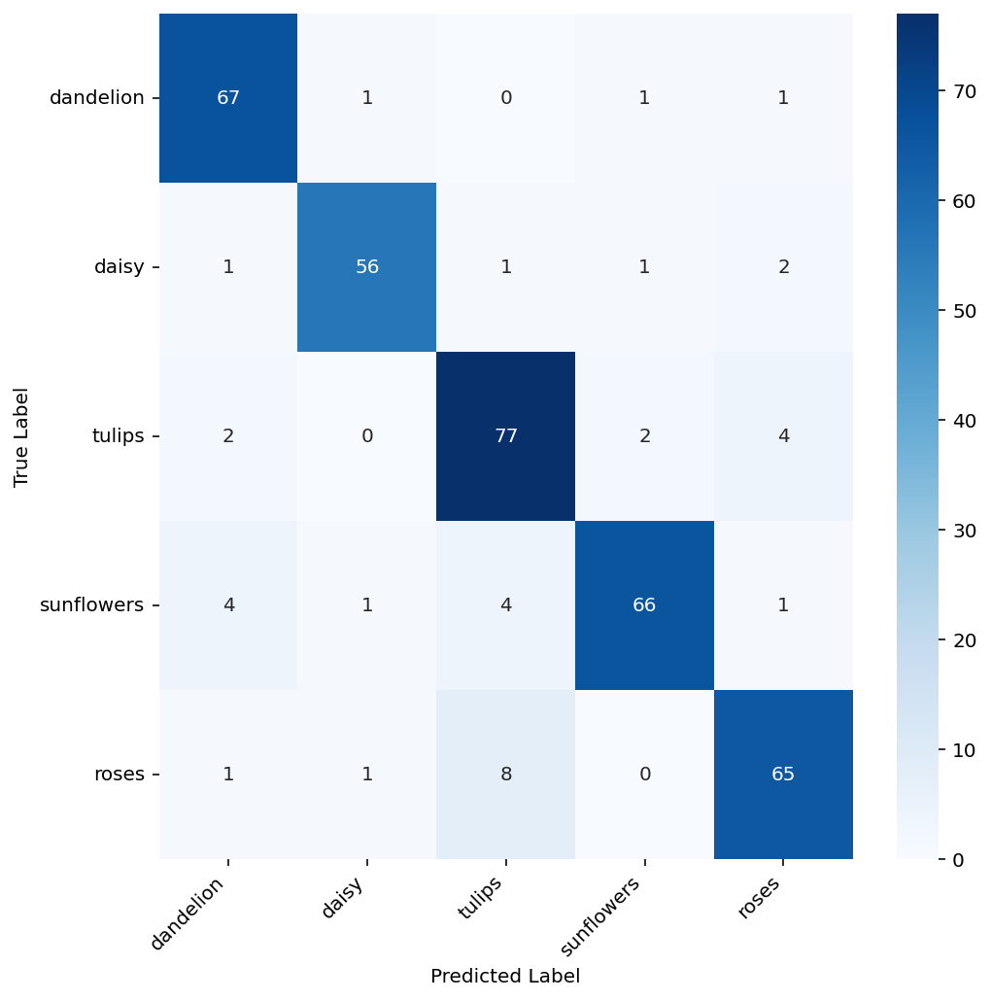

In [71]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

plt.figure(figsize=(8, 8))
cm2 = confusion_matrix(labels, np.argmax(pred, axis=-1))
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(ticks=np.arange(0.5, 5.5), labels=class_names, rotation=45, ha='right')
plt.yticks(ticks=np.arange(0.5, 5.5), labels=class_names, rotation=0)
plt.show()

### 결과 해석
1. 결과적으로 이미지 크기를 160x160에서 240x240 사이즈로 확대했을 때 83%의 벽을 뚫을 수 있었다.
2. 이는 원본 이미지의 위치 데이터를 소실하지 않고 더 보존한 상태에서 학습을 했을 때 이미지의 위치 정보를 네트워크에 더 잘 feeding 할 수 있었던 것으로 생각된다.
3. accuracy 뿐만 아니라 f1 score도 평균적으로 90%에 달하는 성능을 나타냈다.

# 3-3. VGG16을 활용한 Transfer Learning 모델링

### Transfer Learning 전략
0. VGG16 모델은 이미지 크기를 240로 변경하기 전에 inceptionV3의 83% 성능을 넘기 위해 시도했던 모델이다.
1. InceptionV3과 동일한 전략으로 진행하였다

In [72]:
# VGG16 모델 생성
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Convolution base만 가져온다.
VGG16_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [73]:
image_batch.shape

TensorShape([32, 240, 240, 3])

In [74]:
feature_batch = VGG16_model(image_batch)
feature_batch.shape

TensorShape([32, 7, 7, 512])

VGG16의 convolution base layer를 통과하면 5, 5, 512 크기의 feature map을 가진다.

In [75]:
VGG16_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 240, 240, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 240, 240, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 240, 240, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 120, 120, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 120, 120, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 120, 120, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 60, 60, 128)       0     

### Classifier layer 생성

Flatten layer를 사용하지 않고 global average pooling을 적용한다. 컴퓨팅 비용을 고려하여 파라미터 수를 최소화한다.

https://gaussian37.github.io/dl-concept-global_average_pooling/

In [76]:
# Flatten이 아닌 GlobalAveragePooling2D 사용 - output size - (Batch size, 2048)
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)

# classifion dense layer
dense_layer_1 = tf.keras.layers.Dense(units=256, activation='relu')
# dropout_layer_1 = tf.keras.layers.Dropout(0.5)
# dense_layer_2 = tf.keras.layers.Dense(units=512, activation='relu')
# dropout_layer_2 = tf.keras.layers.Dropout(0.5)

# 5개 클래스 분류이므로 softmax, units=5
prediction_layer = tf.keras.layers.Dense(units=5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer_1(feature_batch_average))
print(prediction_batch.shape)

(32, 5)


In [77]:
# Pre-trained model의 convolution base 부분의 가중치는 업데이트하지 않는다.
VGG16_model.trainable = False

### 최종 Transfer learing model

In [78]:
model_2_VGG16 = tf.keras.Sequential([
  VGG16_model,
  global_average_layer,
  dense_layer_1,
  prediction_layer
])

In [79]:
model_2_VGG16.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_7 (Dense)              (None, 5)                 1285      
Total params: 14,847,301
Trainable params: 132,613
Non-trainable params: 14,714,688
_________________________________________________________________


### VGG16 기반으로 구성된 이미지 분류기를 학습시키고, 베이스라인 모델과 결과 비교

In [80]:
base_learning_rate = 0.0001
model_2_VGG16.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

학습 전 성능 확인

In [81]:
validation_steps=20
loss0, accuracy0 = model_2_VGG16.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 3s - loss: 1.9273 - accuracy: 0.1608WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 13s 266ms/step - loss: 1.9273 - accuracy: 0.1608
initial loss: 1.93
initial accuracy: 0.16


모델 학습

In [82]:
check_point_cb = callbacks.ModelCheckpoint('VGG16_flowers.h5', save_best_only=True)
early_stopping_cb = callbacks.EarlyStopping(patience=3, monitor='val_accuracy',
                                  restore_best_weights=True)

EPOCHS = 15  
history = model_2_VGG16.fit(train_batches,
                            epochs=EPOCHS,
                            validation_data=validation_batches,
                            callbacks=[check_point_cb, early_stopping_cb])

Epoch 1/15
92/92 [==============================] - 21s 225ms/step - loss: 1.5080 - accuracy: 0.4084 - val_loss: 1.3160 - val_accuracy: 0.5749
Epoch 2/15
92/92 [==============================] - 15s 167ms/step - loss: 1.1893 - accuracy: 0.6526 - val_loss: 1.0710 - val_accuracy: 0.6839
Epoch 3/15
92/92 [==============================] - 16s 168ms/step - loss: 0.9932 - accuracy: 0.7050 - val_loss: 0.9229 - val_accuracy: 0.7248
Epoch 4/15
92/92 [==============================] - 16s 172ms/step - loss: 0.8708 - accuracy: 0.7340 - val_loss: 0.8316 - val_accuracy: 0.7548
Epoch 5/15
92/92 [==============================] - 16s 171ms/step - loss: 0.7862 - accuracy: 0.7544 - val_loss: 0.7592 - val_accuracy: 0.7602
Epoch 6/15
92/92 [==============================] - 16s 170ms/step - loss: 0.7254 - accuracy: 0.7735 - val_loss: 0.7110 - val_accuracy: 0.7711
Epoch 7/15
92/92 [==============================] - 16s 170ms/step - loss: 0.6784 - accuracy: 0.7885 - val_loss: 0.6709 - val_accuracy: 0.7793

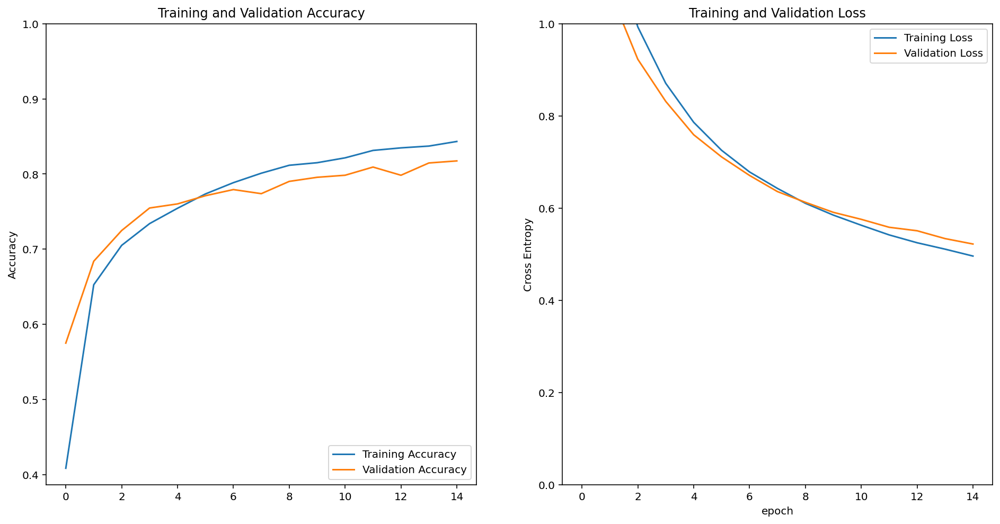

In [83]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### 결과 시각화

In [84]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model_2_VGG16.predict(image_batch)
    pass

predictions

array([[1.23029901e-02, 5.55543080e-02, 7.44706273e-01, 6.92259595e-02,
        1.18210509e-01],
       [9.97839451e-01, 1.21558644e-03, 5.78672225e-05, 7.67604564e-04,
        1.19470729e-04],
       [8.58657598e-01, 7.78419003e-02, 9.41608381e-03, 3.82186361e-02,
        1.58658102e-02],
       [2.36879708e-03, 1.42649608e-02, 5.87454915e-01, 1.30226361e-02,
        3.82888675e-01],
       [8.57137561e-01, 1.09871812e-01, 1.08723994e-02, 1.18110087e-02,
        1.03072627e-02],
       [9.61133838e-01, 2.20547933e-02, 3.37786973e-03, 1.16169667e-02,
        1.81658915e-03],
       [6.85569644e-02, 4.45507839e-02, 5.75948834e-01, 9.71564278e-02,
        2.13786960e-01],
       [2.90231079e-01, 5.71725667e-01, 4.87087993e-03, 1.25138834e-01,
        8.03355686e-03],
       [2.51062457e-02, 7.74401007e-03, 2.89553795e-02, 8.67623031e-01,
        7.05712289e-02],
       [9.98989284e-01, 6.69988338e-04, 4.32161050e-06, 3.31546704e-04,
        4.90113825e-06],
       [9.46652234e-01, 3.9542

In [85]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 1, 2, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 2, 4, 4, 3, 0, 4])

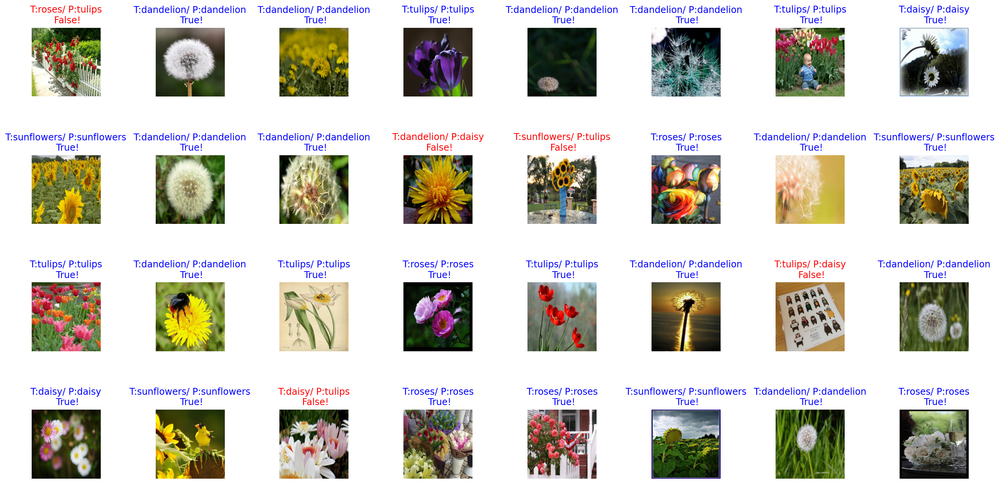

In [86]:
plt.figure(figsize=(22, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    
    # 실제 레이블 / 예측 레이블을 비교할 수 있도록 코드를 작성함
    plt.subplots_adjust(wspace=0.8, hspace=0.1) # 좌우 여백 확보
    title = f'T:{get_label_name(label)}/ P:{get_label_name(prediction)}\n {correct}!' # metadata.feauture에서 label 가져오기
    
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [87]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) 

84.375


### 전체 test set evalution

In [88]:
model_2_VGG16.evaluate(test_batches)

12/12 [==============================] - 2s 133ms/step - loss: 0.5046 - accuracy: 0.8283


[0.5046097636222839, 0.8283378481864929]

In [89]:
from sklearn.metrics import classification_report
# 1. 예측 확률값
pred = model_2_VGG16.predict(test_batches)

# 2. 실제 레이블
labels = []
for _, label in test:
    labels.append(label.numpy())
np.array(labels)

# 3. 클래스 이름 지정
class_names = metadata.features['label'].names

# 4. 분류 보고서 확인
print(classification_report(labels, np.argmax(pred, axis=-1), target_names=class_names))

              precision    recall  f1-score   support

   dandelion       0.77      0.90      0.83        70
       daisy       0.83      0.79      0.81        61
      tulips       0.83      0.85      0.84        85
  sunflowers       0.88      0.75      0.81        76
       roses       0.85      0.85      0.85        75

    accuracy                           0.83       367
   macro avg       0.83      0.83      0.83       367
weighted avg       0.83      0.83      0.83       367



### 히트맵 시각화

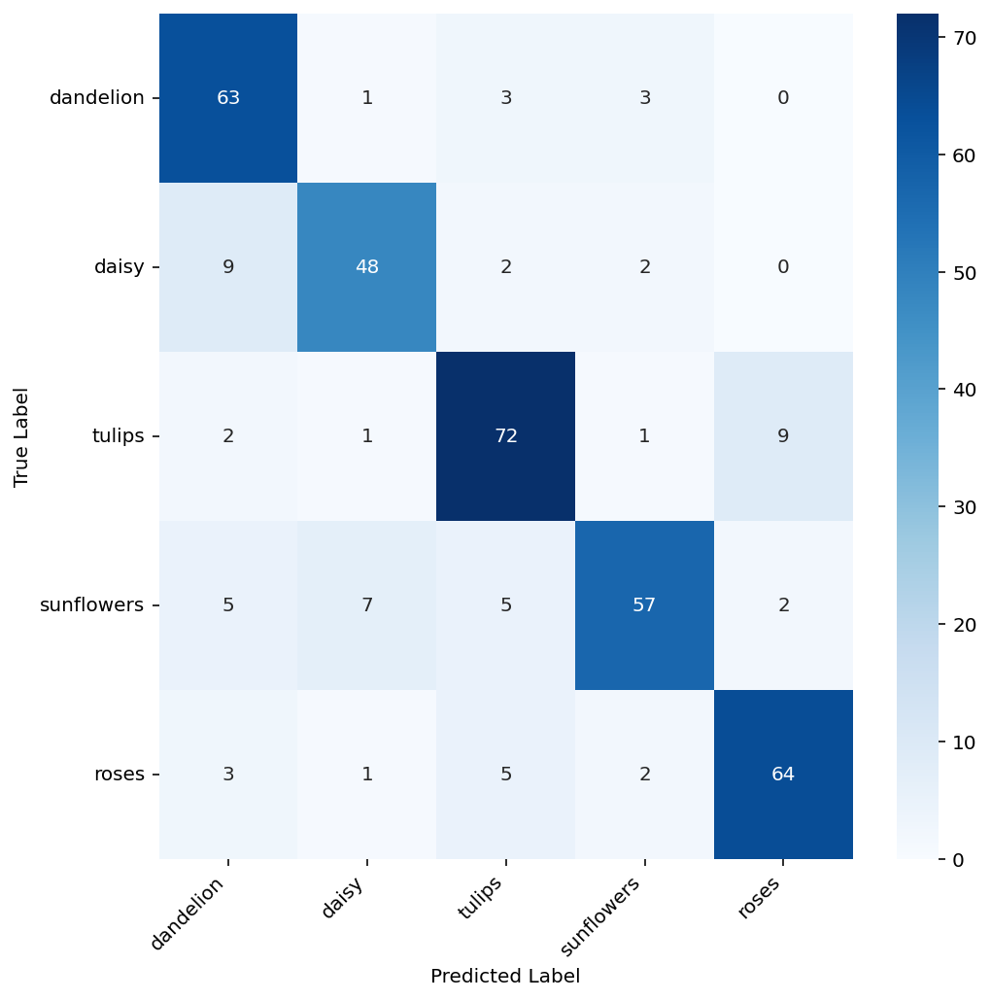

In [90]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

plt.figure(figsize=(8, 8))
cm2 = confusion_matrix(labels, np.argmax(pred, axis=-1))
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(ticks=np.arange(0.5, 5.5), labels=class_names, rotation=45, ha='right')
plt.yticks(ticks=np.arange(0.5, 5.5), labels=class_names, rotation=0)
plt.show()

### 결과 해석
1. 이미지 크기를 160x160에서 240x240 사이즈로 확대했을 때 VGG16 모델도 성능향상을 이루어냈다.
2. VGG16 모델은 계속 학습할 수록 validation accuracy가 조금씩 개선되는 것을 확인했다.
3. InceptionV3 모델로 85% 예측성능을 넘었기 때문에 더 이상의 컴퓨팅 자원을 소비하지 않고 학습을 중단하였다.

# Final Step. 최적의 모델 활용하기

### 1. InceptionV3 model 불러오기

In [91]:
from tensorflow.keras import models

InceptionV3_model = models.load_model('InceptionV3_flowers.h5')
InceptionV3_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Functional)    (None, 6, 6, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 256)               524544    
_________________________________________________________________
dense_5 (Dense)              (None, 5)                 1285      
Total params: 22,328,613
Trainable params: 525,829
Non-trainable params: 21,802,784
_________________________________________________________________


In [92]:
# 모델 성능 확인
InceptionV3_model.evaluate(test_batches)

12/12 [==============================] - 2s 79ms/step - loss: 0.2589 - accuracy: 0.9019


[0.25888726115226746, 0.9019073843955994]

In [ ]:
# ~/aiffel/Deep_Learning/24_Main_Project/flowers/images

In [93]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os

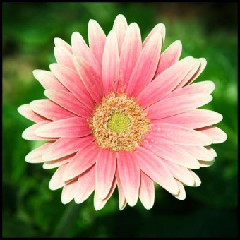

In [94]:
IMG_SIZE = 240
img_dir_path = os.getenv("HOME") + "/aiffel/Deep_Learning/24_Main_Project/flowers/images"
daisy_1_image_path = os.path.join(img_dir_path, 'daisy_1.jpeg')

daisy_1_image = load_img(daisy_1_image_path, target_size=(IMG_SIZE, IMG_SIZE))
daisy_1_image

모델에 넣을 수 있도록 이미지를 numpy array로 변환

In [95]:
daisy_1_image = img_to_array(daisy_1_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
daisy_1_image.shape

(1, 240, 240, 3)

#### 외부 데이터 예측 시각화 함수

In [98]:
def show_and_predict_image(dirpath, filename, img_size=240):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    pred = InceptionV3_model.predict(image)
    pred_index = np.argmax(pred)
    pred_label = class_names[pred_index]
    print(f"This image seems {pred_label} with a probibility of {np.max(pred)}.")

This image seems tulips with a probibility of 1.0.


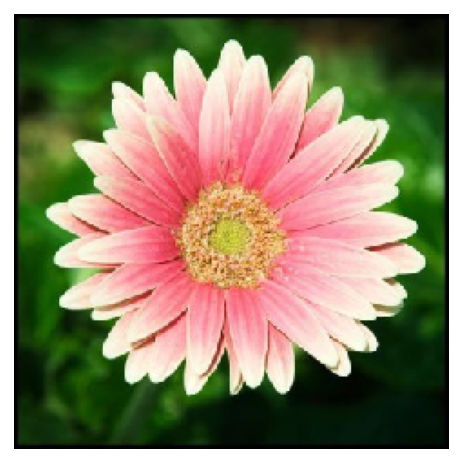

In [99]:
filename = 'daisy_1.jpeg'

show_and_predict_image(img_dir_path, filename)

ㄴ 튤립 같아 보이는 daisy 이미지를 가져온 것이다. 예측을 못함

This image seems tulips with a probibility of 0.8465848565101624.


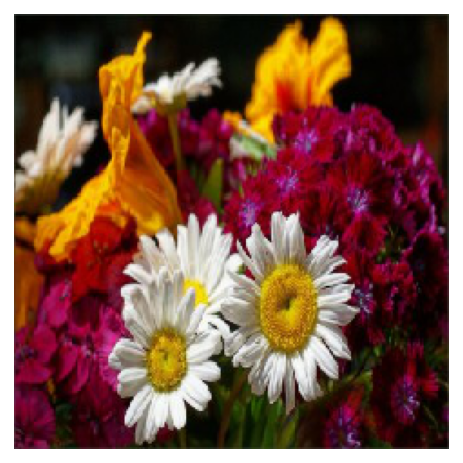

In [101]:
filename = 'daisy_2.jpeg'

show_and_predict_image(img_dir_path, filename)

ㄴ 꽃이 섞여 있는 어려운 그림.. 예측 못함

This image seems tulips with a probibility of 1.0.


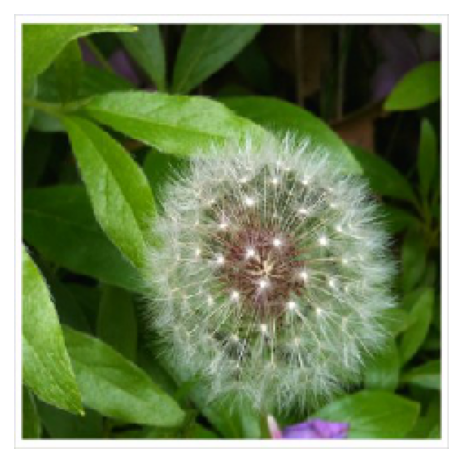

In [102]:
filename = "dandelion_1.jpeg"
show_and_predict_image(img_dir_path, filename)

ㄴ 민들레인를 튤립으로 예측

This image seems tulips with a probibility of 0.9999997615814209.


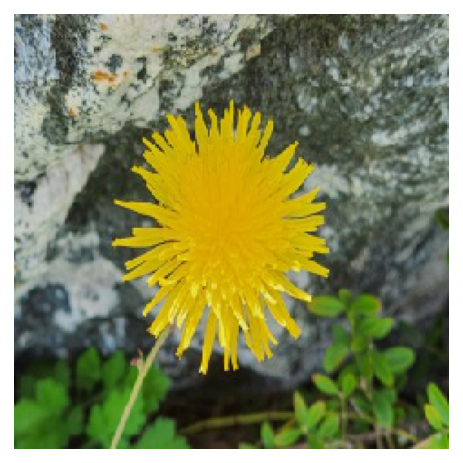

In [103]:
filename = "dandelion_2.jpeg"
show_and_predict_image(img_dir_path, filename)

ㄴ 민들레인를 튤립으로 예측2

This image seems tulips with a probibility of 0.9994699358940125.


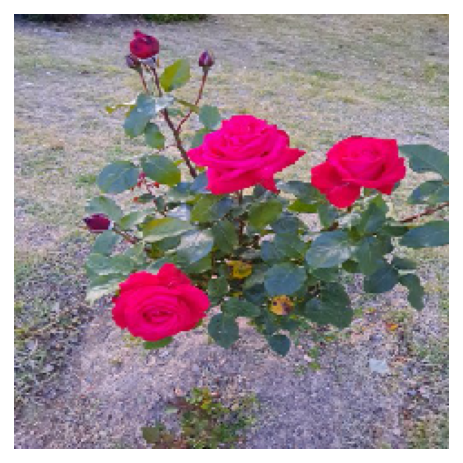

In [105]:
filename = "roses_1.jpeg"
show_and_predict_image(img_dir_path, filename)

This image seems roses with a probibility of 0.9141768217086792.


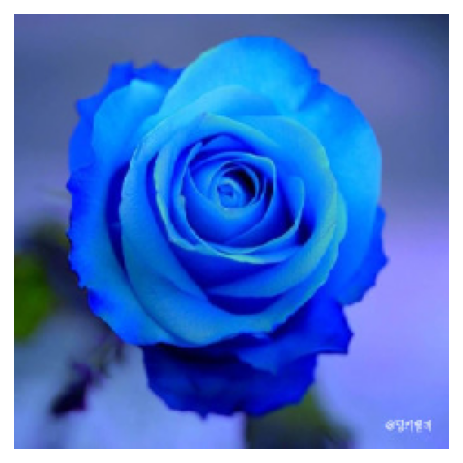

In [106]:
filename = "roses_2.jpeg"
show_and_predict_image(img_dir_path, filename)

ㄴ 파란색 장미를 가져왔는데 잘 예측함

This image seems tulips with a probibility of 1.0.


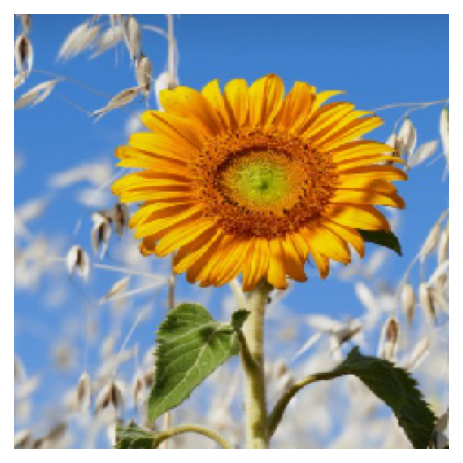

In [107]:
filename = "sunflowers_1.jpeg"
show_and_predict_image(img_dir_path, filename)

ㄴ 해바리긴데 튤립으로 예측함

This image seems tulips with a probibility of 0.99992835521698.


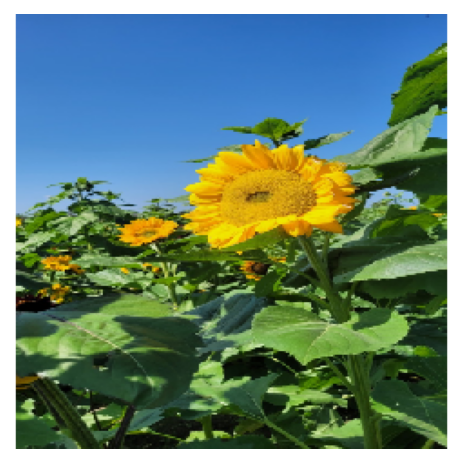

In [108]:
filename = "sunflowers_2.png"
show_and_predict_image(img_dir_path, filename)

This image seems roses with a probibility of 0.9789155125617981.


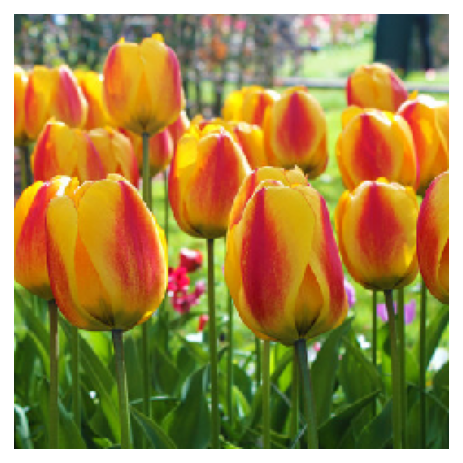

In [109]:
filename = "tulips_1.jpeg"
show_and_predict_image(img_dir_path, filename)

This image seems tulips with a probibility of 1.0.


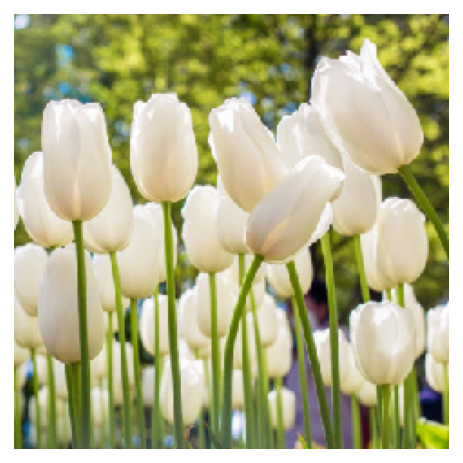

In [110]:
filename = "tulips_2.jpeg"
show_and_predict_image(img_dir_path, filename)

### p.s. 무슨 꽃상(?)일까 -

This image seems tulips with a probibility of 1.0.


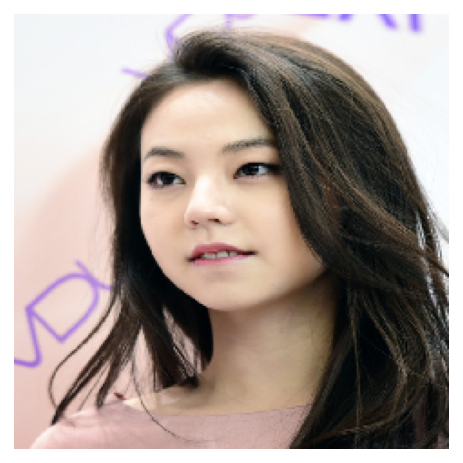

In [111]:
filename = "cat_woman.jpeg"
show_and_predict_image(img_dir_path, filename)

ㄴ 튤립 같은 여자..

This image seems roses with a probibility of 0.7486259341239929.


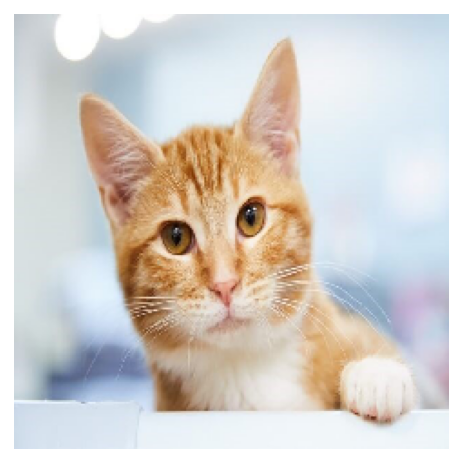

In [112]:
filename = "cat.jpg"
show_and_predict_image(img_dir_path, filename)

ㄴ 장미 같은 냥이..

This image seems tulips with a probibility of 1.0.


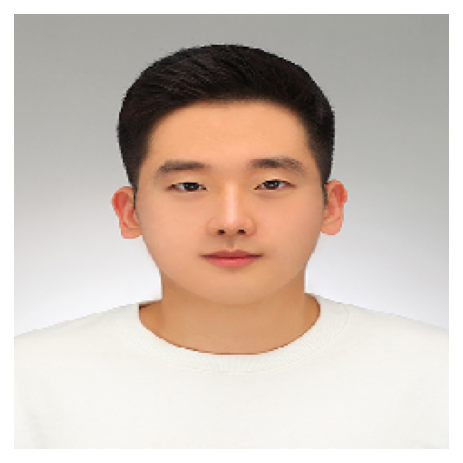

In [113]:
filename = "man.jpg"
show_and_predict_image(img_dir_path, filename)

ㄴ 튤립 같은 나..

# 회고
- 문제해결
1. 80% 정확도에서 오퍼피팅이 급작스럽게 발생하였다. 오버피팅을 줄이기 위해 dense layer의 units 수를 줄이고, dropout을 사용하는 등 여러 시도를 하였지만 개선의 기미가 없었다.
2. 입력 이미지 데이터의 shape을 160x160에서 240x240로 확장했을 때 도저히 넘지 않았던 83%의 validation accuracy를 뚫을 수 있었다.
3. 원래 이미지의 위치 데이터를 더욱 보존함으로써 학습에 도움이 되었던 것 같다. 
4. VGG16 모델보다 InceptionV3 모델이 학습속도도 빠르고, 성능도 좋았다. VGG16은 예측성능이 80%를 넘지 못하였지만 InceptionV3는 90%를 넘는 예측성능을 보였다.
5. tf_flowers 시각화에서 레이블 인덱스와 실제 이름이 헷깔렸다. 그래서 정확한 시각화 코딩을 도전해보았다.

- 더 공부해야할 것
1. Transfer learning 적용 시 convolution base의 상단 layer를 학습시키는 방법을 구현하기 어려웠다. 당장은 필요가 없어서 크게 문제가 되지 않았지만 pre-trained model을 tuning하는 여러 방법에 관해 앞으로 자연어처리 부분에서도 문제를 직면하게 될 것 같다.

- 아쉬운 점
1. 최종 inceptionV3 모델로 인터넷에서 가져온 이미지를 예측했을 때 생각보다 잘 맞추지 못했다...